In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor

In [2]:
# Define a function to concatenate the red and white wine datasets
def join(temp1, temp2):
    temp1['color'] = 'r'    # Add 'r' in the color column for 'Red wine'
    temp2['color'] = 'w'    # Add 'w' in the color column for 'White wine'
    return pd.concat([temp1, temp2])

In [4]:
# Load the red and white wine datasets
red = pd.read_csv("winequality-red.csv", sep = ';')
white = pd.read_csv("winequality-white.csv", sep = ';')

In [5]:
# Remove duplicate rows in both datasets
red = red.drop_duplicates()
white = white.drop_duplicates()

In [6]:
# Combine red and white wine datasets
wine = join(red.copy(), white.copy())

In [7]:
# Display summary statistics for red wine dataset
red_des = red.describe()
print("Red Wine Description:\n", red_des)

Red Wine Description:
        fixed acidity  volatile acidity  citric acid  residual sugar  \
count    1359.000000       1359.000000  1359.000000     1359.000000   
mean        8.310596          0.529478     0.272333        2.523400   
std         1.736990          0.183031     0.195537        1.352314   
min         4.600000          0.120000     0.000000        0.900000   
25%         7.100000          0.390000     0.090000        1.900000   
50%         7.900000          0.520000     0.260000        2.200000   
75%         9.200000          0.640000     0.430000        2.600000   
max        15.900000          1.580000     1.000000       15.500000   

         chlorides  free sulfur dioxide  total sulfur dioxide      density  \
count  1359.000000          1359.000000           1359.000000  1359.000000   
mean      0.088124            15.893304             46.825975     0.996709   
std       0.049377            10.447270             33.408946     0.001869   
min       0.012000       

In [8]:
# Display summary statistics for white wine dataset
white_des = white.describe()
print("\nWhite Wine Description:\n", white_des)


White Wine Description:
        fixed acidity  volatile acidity  citric acid  residual sugar  \
count    3961.000000       3961.000000  3961.000000     3961.000000   
mean        6.839346          0.280538     0.334332        5.914819   
std         0.866860          0.103437     0.122446        4.861646   
min         3.800000          0.080000     0.000000        0.600000   
25%         6.300000          0.210000     0.270000        1.600000   
50%         6.800000          0.260000     0.320000        4.700000   
75%         7.300000          0.330000     0.390000        8.900000   
max        14.200000          1.100000     1.660000       65.800000   

         chlorides  free sulfur dioxide  total sulfur dioxide      density  \
count  3961.000000          3961.000000           3961.000000  3961.000000   
mean      0.045905            34.889169            137.193512     0.993790   
std       0.023103            17.210021             43.129065     0.002905   
min       0.009000    

In [9]:
# Display summary statistics for the combined wine dataset
wine_des = wine.describe()
print("\nCombined Wine Description:\n", wine_des)


Combined Wine Description:
        fixed acidity  volatile acidity  citric acid  residual sugar  \
count    5320.000000       5320.000000  5320.000000     5320.000000   
mean        7.215179          0.344130     0.318494        5.048477   
std         1.319671          0.168248     0.147157        4.500180   
min         3.800000          0.080000     0.000000        0.600000   
25%         6.400000          0.230000     0.240000        1.800000   
50%         7.000000          0.300000     0.310000        2.700000   
75%         7.700000          0.410000     0.400000        7.500000   
max        15.900000          1.580000     1.660000       65.800000   

         chlorides  free sulfur dioxide  total sulfur dioxide      density  \
count  5320.000000          5320.000000           5320.000000  5320.000000   
mean      0.056690            30.036654            114.109023     0.994535   
std       0.036863            17.805045             56.774223     0.002966   
min       0.009000 

c:\Users\rahul\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


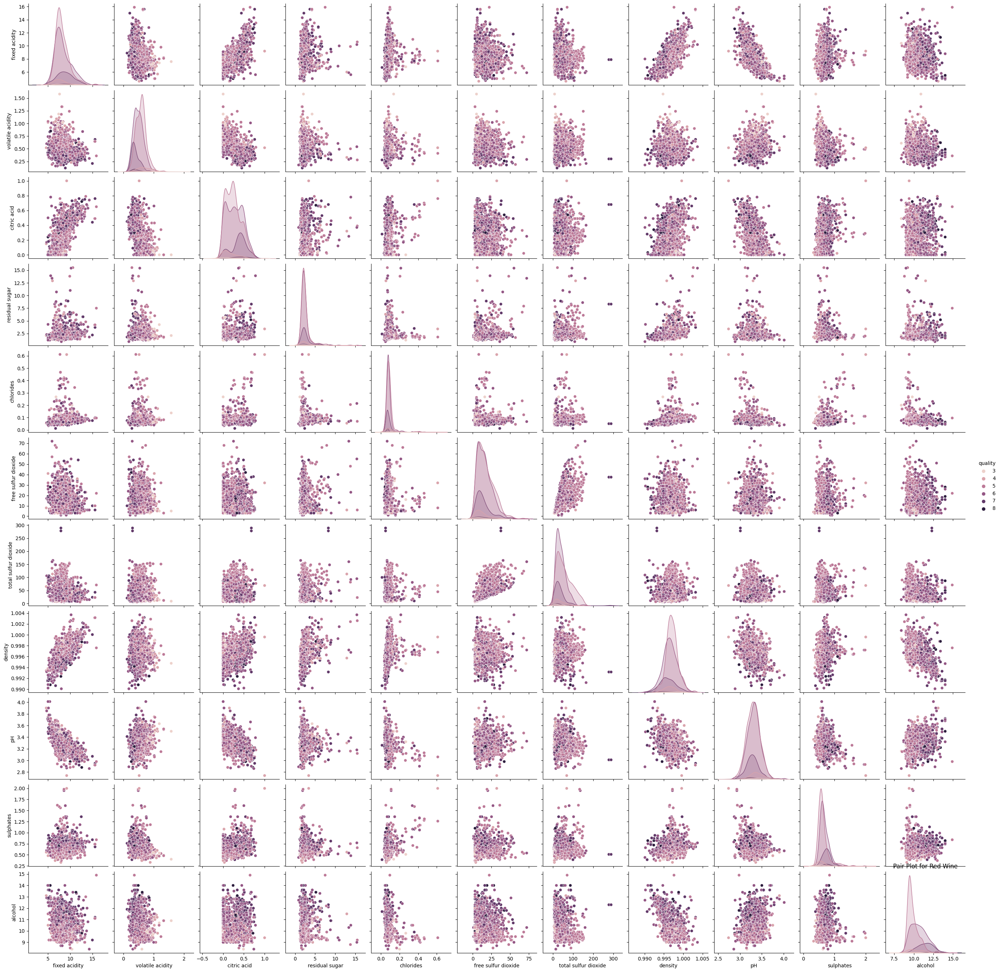

In [10]:
# Create pair plots to visualize relationships between features and wine quality for red wine
sns.pairplot(red, hue='quality')
plt.title('Pair Plot for Red Wine')
plt.show()

c:\Users\rahul\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


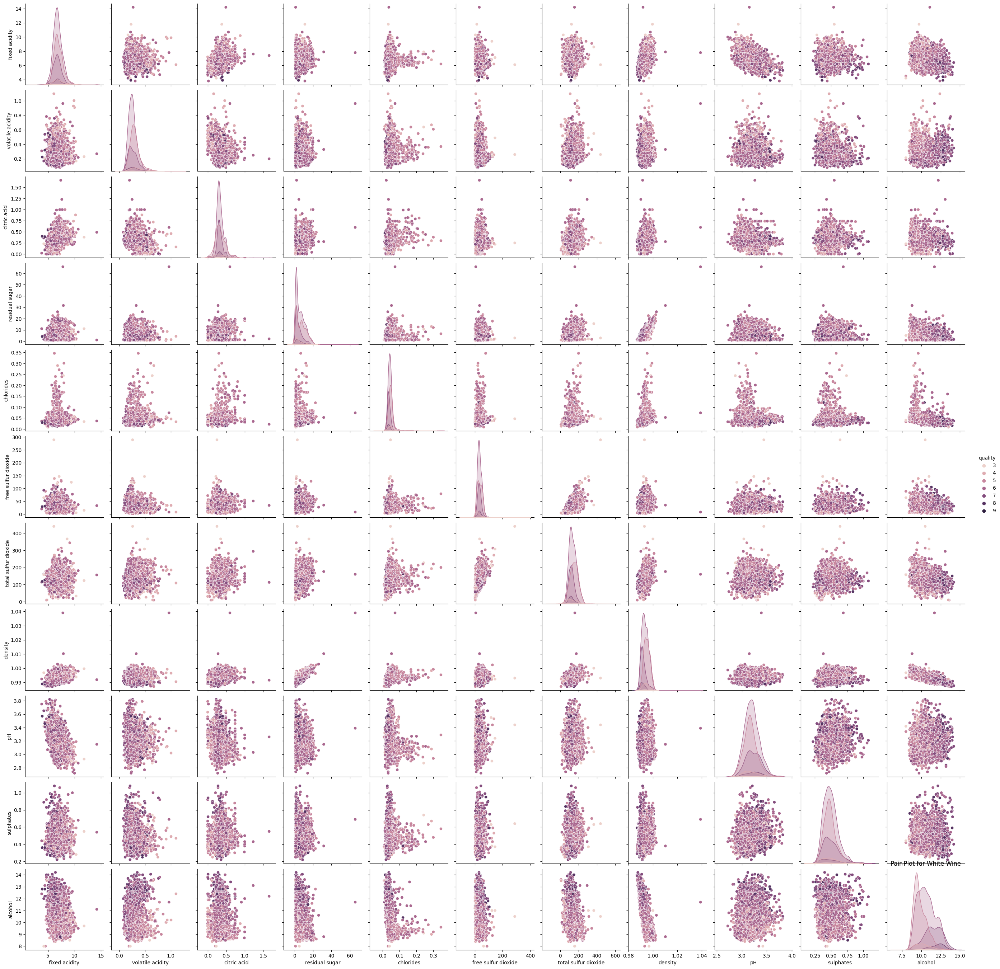

In [11]:
# Create pair plots to visualize relationships between features and wine quality for white wine
sns.pairplot(white, hue='quality')
plt.title('Pair Plot for White Wine')
plt.show()

c:\Users\rahul\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


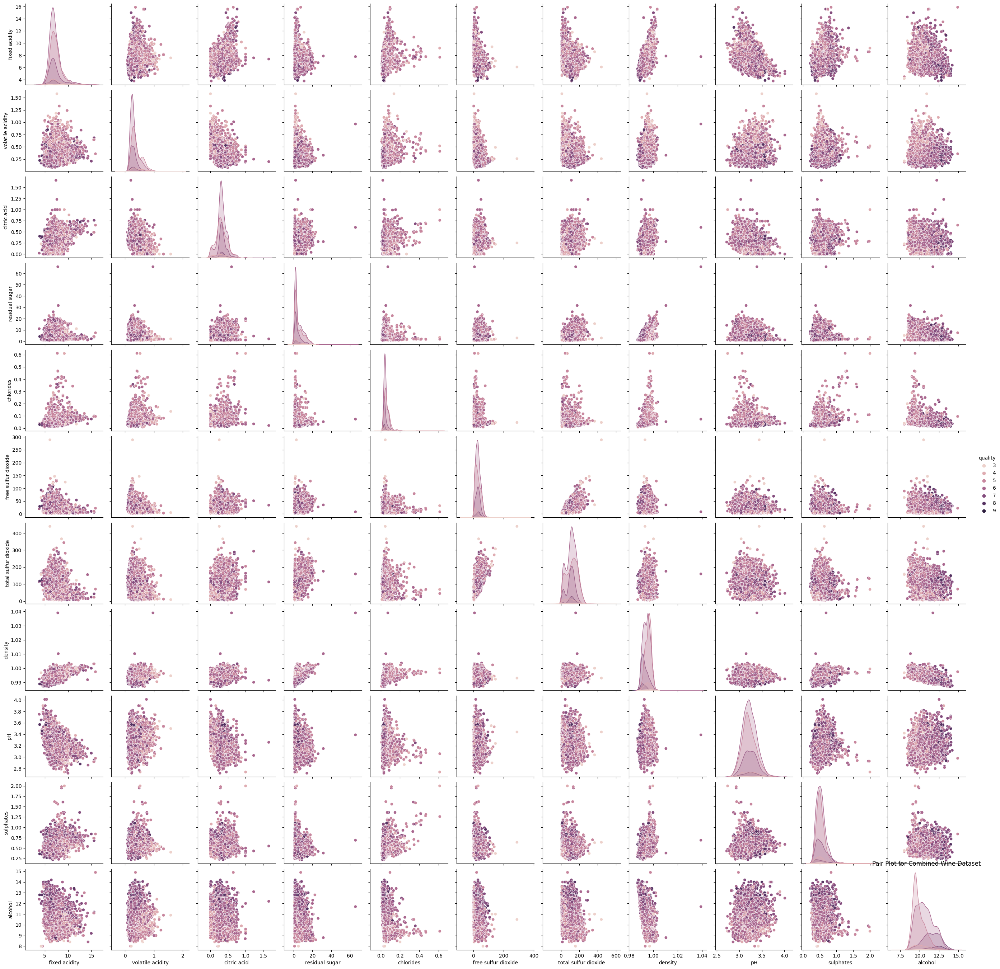

In [12]:
# Create pair plots to visualize relationships between features and wine quality for combined wine dataset
sns.pairplot(wine, hue='quality')
plt.title('Pair Plot for Combined Wine Dataset')
plt.show()

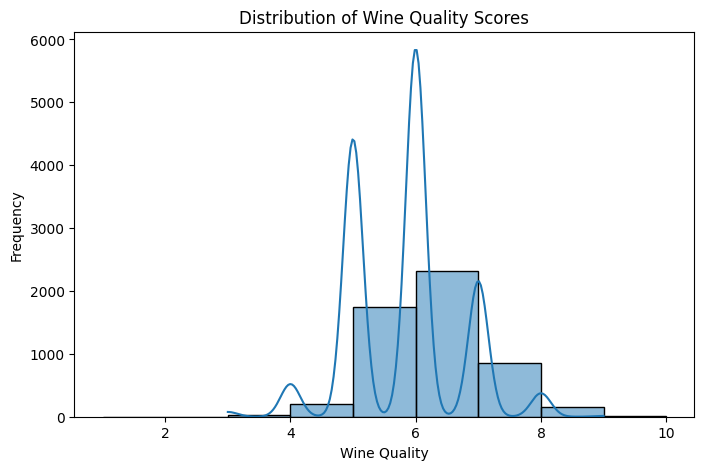

In [13]:
# Create a histogram to visualize the distribution of wine quality scores
plt.figure(figsize=(8, 5))
sns.histplot(wine['quality'], bins=range(1, 11), kde=True)
plt.xlabel('Wine Quality')
plt.ylabel('Frequency')
plt.title('Distribution of Wine Quality Scores')
plt.show()

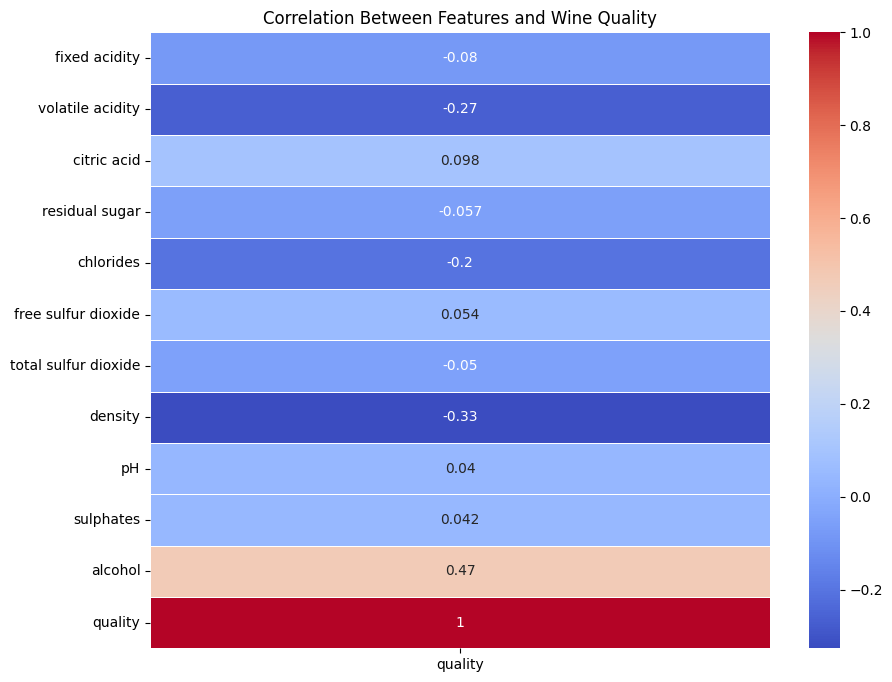

In [14]:
# Compute the correlation matrix and create a heatmap
correlation_matrix = wine.drop(columns=['color']).corr()
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix[['quality']], annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Between Features and Wine Quality')
plt.show()

In [15]:
# Identify important factors influencing wine quality using Random Forest Regressor

In [16]:
# Separate features (X) and target (y)
X = wine.drop(columns=['color']).drop('quality', axis=1)
y = wine['quality']

In [17]:
# Train a Random Forest Regressor model
model = RandomForestRegressor(random_state=42)
model.fit(X, y)

RandomForestRegressor(random_state=42)

In [18]:
# Get feature importances
feature_importances = model.feature_importances_

In [19]:
# Create a DataFrame to visualize feature importances
imp_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})
imp_df = imp_df.sort_values(by='Importance', ascending=False)

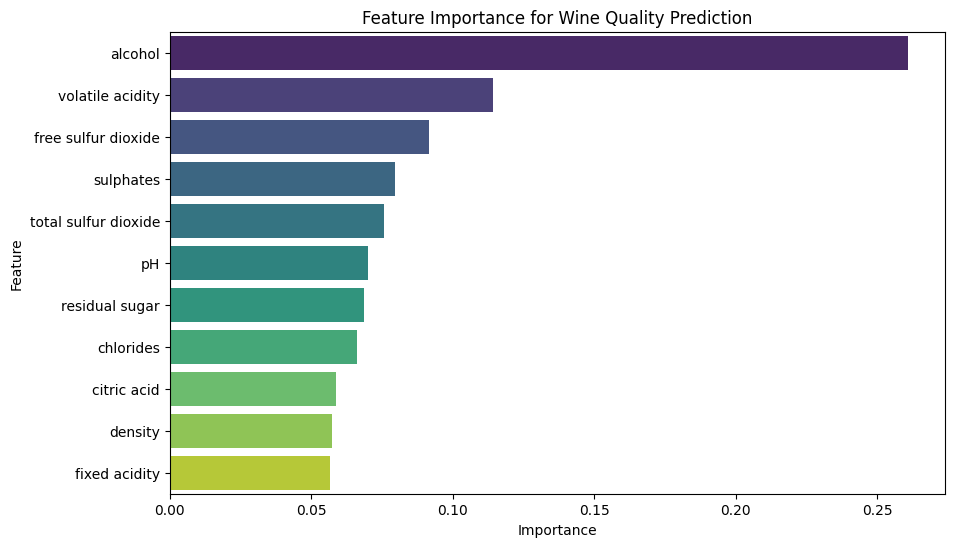

In [20]:
# Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(data=imp_df, x='Importance', y='Feature', palette='viridis')
plt.title('Feature Importance for Wine Quality Prediction')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()